In [1]:
import os
import cv2
import math
import pafy
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from moviepy.editor import *
from collections import deque
import matplotlib.pyplot as plt
%matplotlib inline
 
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

In [2]:
seed_constant = 23
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

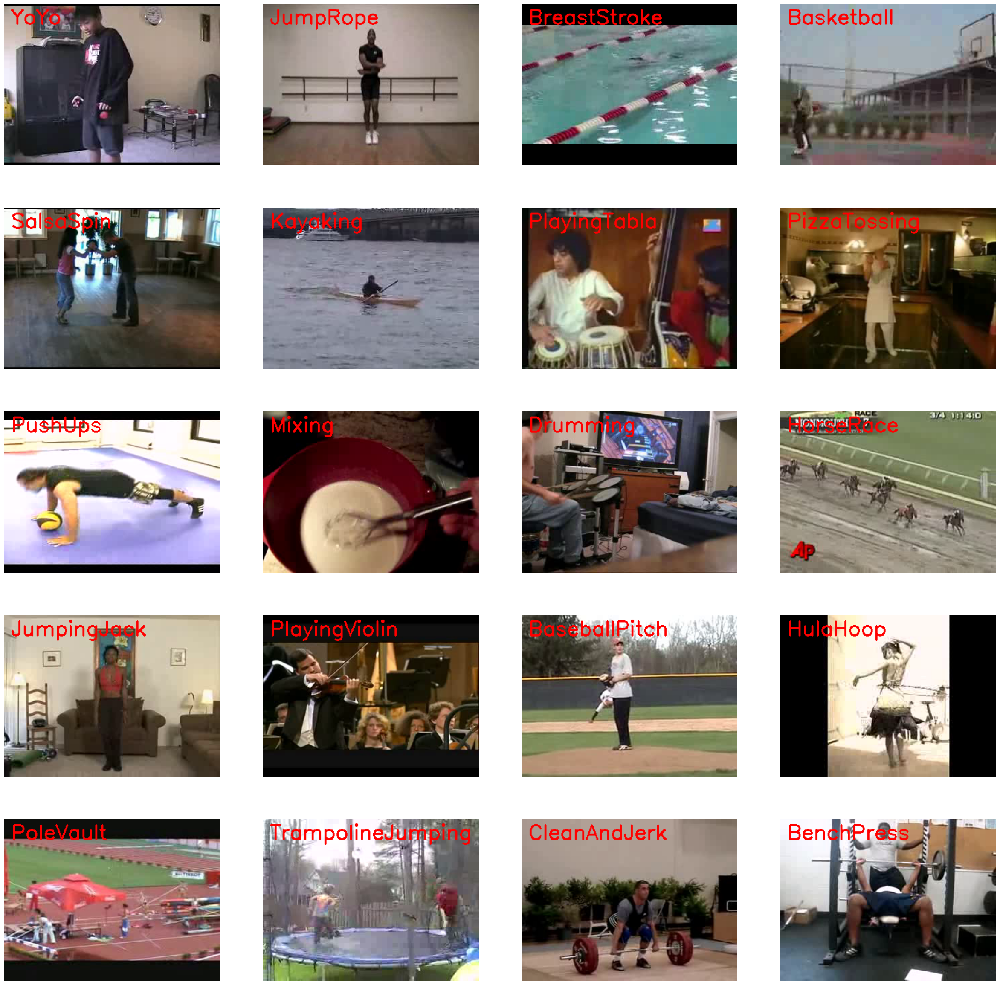

In [3]:
plt.figure(figsize = (30, 30))
all_classes_names = os.listdir('UCF50')
random_range = random.sample(range(len(all_classes_names)), 20)
for counter, random_index in enumerate(random_range, 1):
    selected_class_Name = all_classes_names[random_index]
    video_files_names_list = os.listdir(f'UCF50/{selected_class_Name}')
    selected_video_file_name = random.choice(video_files_names_list)
    video_reader = cv2.VideoCapture(f'UCF50/{selected_class_Name}/{selected_video_file_name}')
    _, bgr_frame = video_reader.read()
    video_reader.release()
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)
    cv2.putText(rgb_frame, selected_class_Name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
    plt.subplot(5, 4, counter)
    plt.imshow(rgb_frame)
    plt.axis('off')

In [45]:
image_height, image_width = 64, 64
max_images_per_class = 8000
 
dataset_directory = "UCF50"
classes_list = ["WalkingWithDog", "TaiChi", "Punch", "Rowing"]
 
model_output_size = len(classes_list)

In [46]:
def frames_extraction(video):
    frames = []
    video_reader = cv2.VideoCapture(video)
    while True:
        success, frame = video_reader.read()
        if not success:
            break
        resized_frame = cv2.resize(frame, (image_height, image_width))
        normalized_frame = resized_frame / 255
        frames.append(normalized_frame)
    video_reader.release()
    return frames

In [47]:
dataset_directory = 'UCF50'
def create_ds():
    temp_features = [] 
    features = []
    labels = []
    for class_index, class_name in enumerate(classes_list):
        print(f'Extracting Data of Class: {class_name}')
        files_list = os.listdir(os.path.join(dataset_directory, class_name))
        for file_name in files_list:
            video_file_path = os.path.join(dataset_directory, class_name, file_name)
            frames = frames_extraction(video_file_path)
            temp_features.extend(frames)
        features.extend(random.sample(temp_features, max_images_per_class))
        labels.extend([class_index] * max_images_per_class)
        temp_features.clear()
    features = np.asarray(features)
    labels = np.array(labels)  
    return features, labels

In [48]:
features, labels = create_ds()
one_hot_encoded_labels = to_categorical(labels)

Extracting Data of Class: WalkingWithDog
Extracting Data of Class: TaiChi
Extracting Data of Class: Punch
Extracting Data of Class: Rowing


In [49]:
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.2, shuffle = True, random_state = seed_constant)

In [50]:
model = Sequential()
model.add(Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu', input_shape = (image_height, image_width, 3)))
model.add(Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2, 2)))
model.add(GlobalAveragePooling2D())
model.add(Dense(256, activation = 'relu'))
model.add(BatchNormalization())
model.add(Dense(model_output_size, activation = 'softmax'))
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 62, 62, 64)        1792      
                                                                 
 conv2d_5 (Conv2D)           (None, 60, 60, 64)        36928     
                                                                 
 batch_normalization_4 (Batc  (None, 60, 60, 64)       256       
 hNormalization)                                                 
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 30, 30, 64)       0         
 2D)                                                             
                                                                 
 global_average_pooling2d_2   (None, 64)               0         
 (GlobalAveragePooling2D)                                        
                                                      

In [51]:
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = 'min', restore_best_weights = True)
model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])
model_training_history = model.fit(x = features_train, y = labels_train, epochs = 10, batch_size = 8, shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback])

Epoch 1/10
2560/2560 [==============================] - 317s 123ms/step - loss: 0.5297 - accuracy: 0.7901 - val_loss: 0.5716 - val_accuracy: 0.8217
Epoch 2/10
2560/2560 [==============================] - 324s 126ms/step - loss: 0.2382 - accuracy: 0.9149 - val_loss: 0.7099 - val_accuracy: 0.7686
Epoch 3/10
2560/2560 [==============================] - 325s 127ms/step - loss: 0.1497 - accuracy: 0.9483 - val_loss: 0.1704 - val_accuracy: 0.9445
Epoch 4/10
2560/2560 [==============================] - 337s 132ms/step - loss: 0.1222 - accuracy: 0.9585 - val_loss: 0.0347 - val_accuracy: 0.9889
Epoch 5/10
2560/2560 [==============================] - 366s 143ms/step - loss: 0.0929 - accuracy: 0.9686 - val_loss: 0.7333 - val_accuracy: 0.8744
Epoch 6/10
2560/2560 [==============================] - 325s 127ms/step - loss: 0.0816 - accuracy: 0.9724 - val_loss: 0.0470 - val_accuracy: 0.9848
Epoch 7/10
2560/2560 [==============================] - 306s 120ms/step - loss: 0.0737 - accuracy: 0.9765 - val_

In [52]:
model_evaluation_history = model.evaluate(features_test, labels_test)

200/200 [==============================] - 19s 94ms/step - loss: 0.0249 - accuracy: 0.9923


In [53]:
def plot_metric(metric_name_1, metric_name_2, plot_name):
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2] 
    epochs = range(len(metric_value_1))
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)
    plt.title(str(plot_name))
    plt.legend()

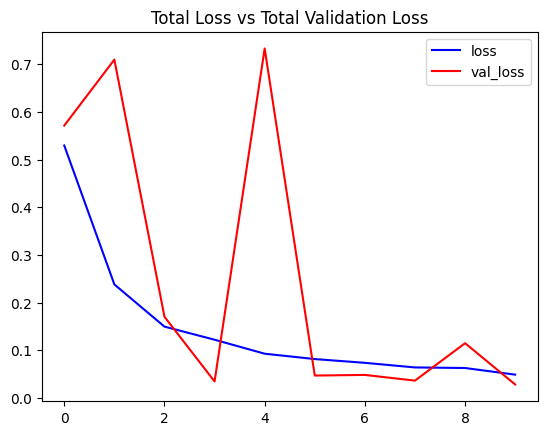

In [54]:
plot_metric('loss', 'val_loss', 'Total Loss vs Total Validation Loss')

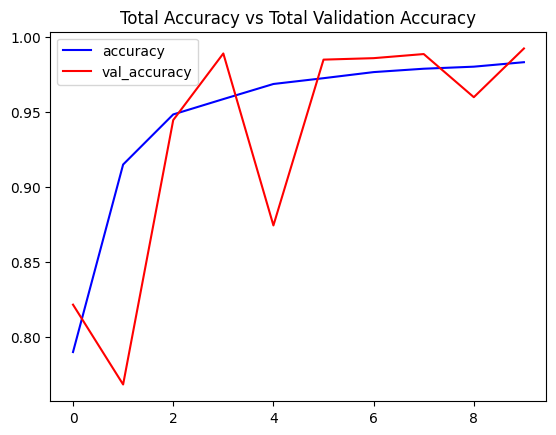

In [55]:
plot_metric('accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

In [56]:
def predict_on_live_video(video_file_path, output_file_path, window_size):
    predicted_labels_probabilities_deque = deque(maxlen = window_size)
    video_reader = cv2.VideoCapture(video_file_path)
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'), 24, (original_video_width, original_video_height))
    while True:
        status, frame = video_reader.read() 
        if not status:
            break
        resized_frame = cv2.resize(frame, (image_height, image_width))
        normalized_frame = resized_frame / 255
        predicted_labels_probabilities = model.predict(np.expand_dims(normalized_frame, axis = 0))[0]
        predicted_labels_probabilities_deque.append(predicted_labels_probabilities)
        if len(predicted_labels_probabilities_deque) == window_size:
            predicted_labels_probabilities_np = np.array(predicted_labels_probabilities_deque)
            predicted_labels_probabilities_averaged = predicted_labels_probabilities_np.mean(axis = 0)
            predicted_label = np.argmax(predicted_labels_probabilities_averaged)
            predicted_class_name = classes_list[predicted_label]
            cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
        video_writer.write(frame)
    video_reader.release()
    video_writer.release()

In [57]:
window_size = 25
input_video_file_path = r"preetham.mp4"
output_video_file_path = f'{input_video_file_path} Output -Output-WSize {window_size}.mp4'
predict_on_live_video(input_video_file_path, output_video_file_path, window_size)
VideoFileClip(output_video_file_path).ipython_display(width = 500)

1/1 [==============================] - 0s 31ms/step
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
